In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import random
import scipy
import scanpy as sc
import scvi

sc.set_figure_params(figsize=(4, 4))

This notebook is based on Katie's at `/project2/gilad/katie/ebQTL/ebQTL_lowpass_scVI_NB.ipynb`

In [ ]:
eb_adata = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.TEMP.filtered.h5ad")

In [ ]:
sc.pp.highly_variable_genes(eb_adata, n_top_genes=3000, flavor='seurat_v3', subset=True)

In [ ]:
eb_adata

In [ ]:
scvi.data.setup_anndata(eb_adata, batch_key="library.prep.batch",
                        categorical_covariate_keys=['Collection.Date'])

In [ ]:
vae = scvi.model.SCVI(eb_adata, n_layers=2, n_latent=30,
                      gene_likelihood='nb')

In [ ]:
vae

In [ ]:
vae.train()

In [ ]:
eb_adata.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.scvi_input.h5ad")

In [ ]:
vae.save("/project2/gilad/jpopp/ebQTL/data/scvi_models/scvi_nb_ebonly_20211012", save_anndata=True)

In [ ]:
eb_adata.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(eb_adata, use_rep="X_scVI")
sc.tl.leiden(eb_adata)
sc.tl.umap(eb_adata)

In [ ]:
sc.pl.umap(eb_adata, color=['library.prep.batch'])

In [ ]:
eb_adata.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.scvi_processed.h5ad")

For further visualization it'll be useful to work with scaled data

In [ ]:
eb_adata.layers['counts'] = eb_adata.X
sc.pp.normalize_total(eb_adata)
sc.pp.log1p(eb_adata)
eb_adata.layers['lognorm'] = eb_adata.X
sc.pp.scale(eb_adata)
eb_adata.layers['scaled'] = eb_adata.X

In [ ]:
eb_adata.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.scvi_processed_and_scaled.h5ad")

## Marker Gene Annotation

In [3]:
eb_adata = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.scvi_processed_and_scaled.h5ad")

### Pluripotent Cells

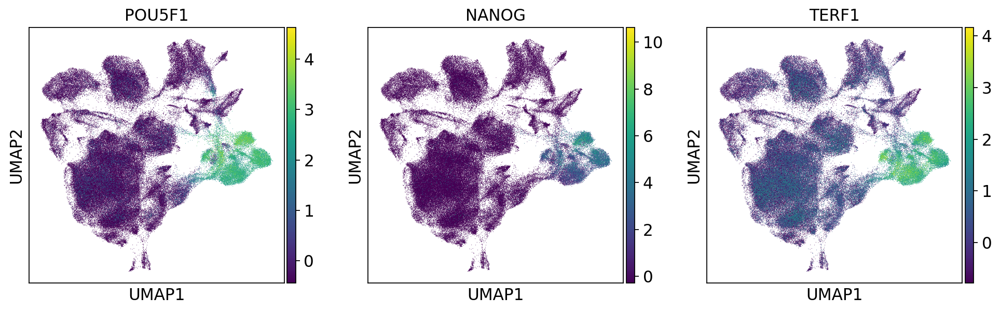

In [3]:
sc.pl.umap(eb_adata, color=['POU5F1', 'NANOG', 'TERF1'], use_raw=False)

Do the distinct clusters within iPSCs correspond to phases of the cell cycle?

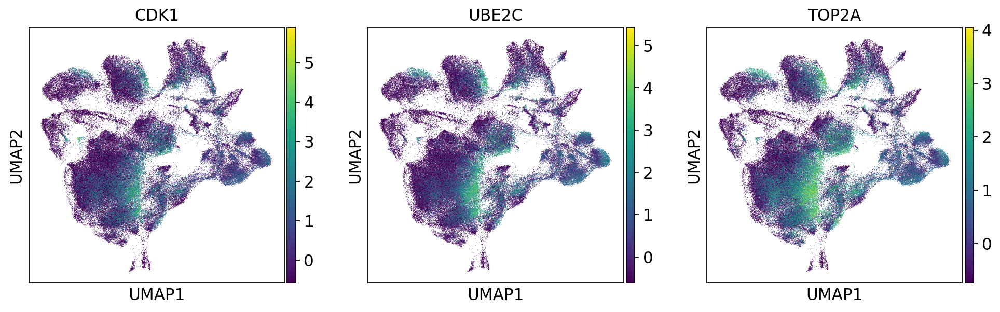

In [6]:
sc.pl.umap(eb_adata, color=['CDK1', 'UBE2C', 'TOP2A'], use_raw=False)

Probably not but we are seeing cell cycle effects in other clusters

### Endoderm Lineage

Definition of early endoderm occurs when cells express GATA6 instead of continuing to express NANOG

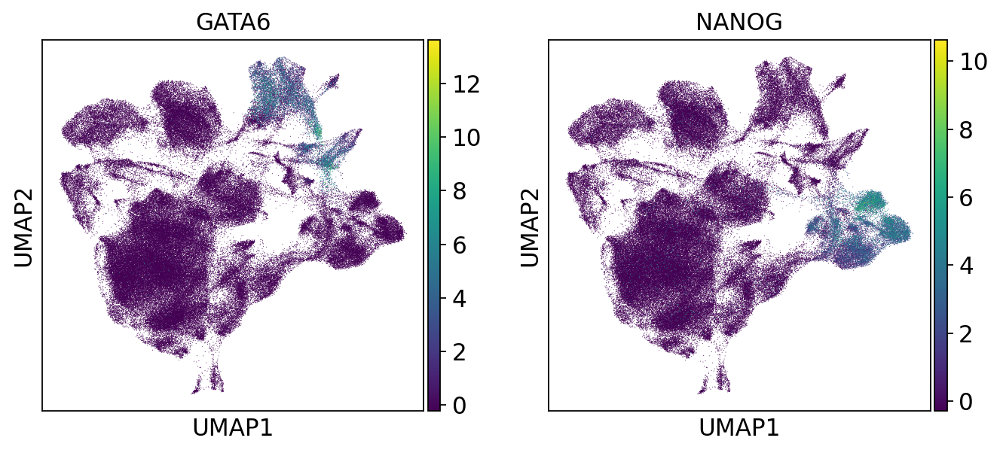

In [8]:
sc.pl.umap(eb_adata, color=['GATA6', 'NANOG'], use_raw=False)

AFP and FGB are expressed in hepatocytes (or perhaps hepatoblasts, a bi-potential precursor of hepatocytes)

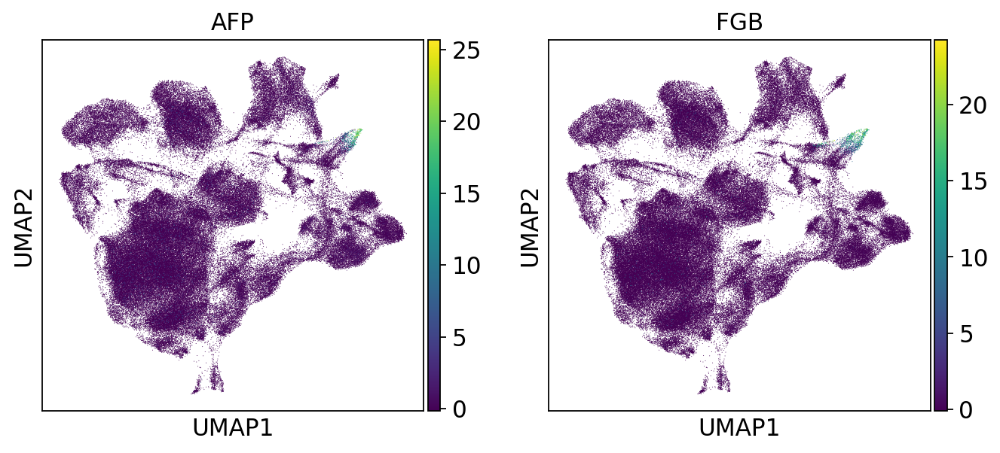

In [9]:
sc.pl.umap(eb_adata, color=['AFP', 'FGB'], use_raw=False)

## Isolating the endoderm and pluripotent cells

Now let's extract these endoderm cells so we can get a glimpse of solely endoderm differentiation

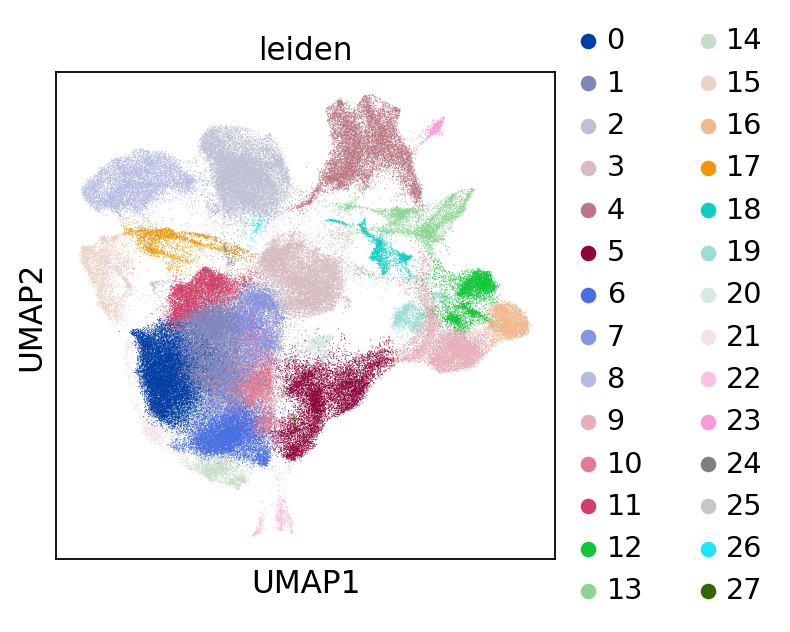

In [4]:
sc.pl.umap(eb_adata, color='leiden')

Clusters 9, 16, 12, and 19 are iPSC, cluster 13 is endoderm

In [ ]:
is_endo = [c in ['9', '16', '12', '19', '13'] for c in eb_adata.obs['leiden']]
endo_cells = eb_adata.obs_names[is_endo]

In [ ]:
eb_endoderm = eb_adata[is_endo, :].raw.to_adata()

In [ ]:
eb_endoderm.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.endoderm.raw.h5ad")

Save a processed version of the iPSC - endoderm lineage dataset

In [33]:
eb_endoderm = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.endoderm.raw.h5ad")

In [ ]:
sc.pp.filter_genes(eb_endoderm, min_cells=3)
eb_endoderm.layers['counts'] = eb_endoderm.X
sc.pp.highly_variable_genes(eb_endoderm, n_top_genes=5000, flavor='seurat_v3', subset=True)
sc.pp.normalize_total(eb_endoderm)
sc.pp.log1p(eb_endoderm)
eb_endoderm.layers['lognorm'] = eb_endoderm.X

In [ ]:
sc.pp.scale(eb_endoderm)
eb_endoderm.layers['scaled'] = eb_endoderm.X

In [ ]:
sc.tl.pca(eb_endoderm)

In [ ]:
sc.pl.pca(eb_endoderm, color=['MIXL1', 'GATA6'])

In [ ]:
eb_endoderm.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.endoderm.processed.h5ad")

Save just the iPSC cells

In [49]:
eb_endoderm = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.endoderm.raw.h5ad")

In [50]:
is_ipsc = [c in ['9', '16', '12', '19'] for c in eb_endoderm.obs['leiden']]
ipsc_adata = eb_endoderm[is_ipsc]
ipsc_adata.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.ipsc.raw.h5ad")

## Comparing iPSCs to reference

In [51]:
ipsc_adata = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.ipsc.raw.h5ad")

In [52]:
hesc_adata = sc.read_h5ad("/project2/gilad/katie/ebQTL/scHCL_hESC.h5ad")

In [54]:
ipsc_adata.obs['celltype'] = 'IPSC'
hesc_adata.obs['celltype'] = 'ESC'

In [55]:
hesc_adata.obs['Collection.Date'] = 'N/A'
hesc_adata.obs['library.prep.batch'] = 'N/A'
hesc_adata.obs['leiden'] = 'N/A'

In [56]:
eb_hesc_adata = ipsc_adata.concatenate(hesc_adata, join = 'inner', batch_key= 'source')

/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/anndata/_core/merge.py:895: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [57]:
eb_hesc_adata.obs['Collection.Date'] = pd.Categorical(eb_hesc_adata.obs['Collection.Date'])
eb_hesc_adata.obs['library.prep.batch'] = pd.Categorical(eb_hesc_adata.obs['library.prep.batch'])
eb_hesc_adata.obs['leiden'] = pd.Categorical(eb_hesc_adata.obs['leiden'])
eb_hesc_adata.obs['celltype'] = pd.Categorical(eb_hesc_adata.obs['celltype'])
eb_hesc_adata.layers['counts'] = eb_hesc_adata.X

In [64]:
sc.pp.highly_variable_genes(eb_hesc_adata, n_top_genes=3000, flavor='seurat_v3', subset=True)

/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:144: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  df.loc[: int(n_top_genes), 'highly_variable'] = True


In [65]:
scvi.data.setup_anndata(eb_hesc_adata, batch_key="celltype",
                        categorical_covariate_keys=['Collection.Date', 'library.prep.batch'])

INFO     Using batches from adata.obs["celltype"]                                            
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 18504 cells, 3000 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 2 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


In [66]:
vae = scvi.model.SCVI(eb_hesc_adata, n_layers=2, n_latent=30,
                      gene_likelihood='nb')

In [67]:
vae.train()

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
Set SLURM handle signals.


Epoch 400/400: 100%|██████████| 400/400 [11:26<00:00,  1.72s/it, loss=2.55e+03, v_num=1]


In [68]:
eb_hesc_adata.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.hesc.ipsc.h5ad")
vae.save("/project2/gilad/jpopp/ebQTL/data/scvi_models/scvi_nb_20211105", save_anndata=True)

... storing 'DROPLET.TYPE' as categorical
... storing 'individual' as categorical
... storing 'SCT_snn_res.0.8' as categorical
... storing 'seurat_clusters' as categorical
... storing 'FREE.TYPE' as categorical
... storing 'ALL.TYPE' as categorical
... storing 'all.individual' as categorical
... storing 'c.date' as categorical
... storing 'who.dissociated.the.lines.for.formation' as categorical
... storing 'comments' as categorical
... storing 'approx..time.in.accumax..in.minutes.' as categorical
... storing 'Sample.ID' as categorical
... storing 'col.group' as categorical


In [3]:
eb_hesc_adata = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.hesc.ipsc.h5ad")
vae = scvi.model.SCVI.load("/project2/gilad/jpopp/ebQTL/data/scvi_models/scvi_nb_20211031")

INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Registered keys:['X', 'batch_indices', 'local_l_mean', 'local_l_var', 'labels',     
         'cat_covs']                                                                         
INFO     Successfully registered anndata object containing 22391 cells, 14223 vars, 2        
         batches, 1 labels, and 0 proteins. Also registered 2 extra categorical covariates   
         and 0 extra continuous covariates.                                                  


In [4]:
eb_hesc_adata.obsm["X_scVI"] = vae.get_latent_representation()

In [5]:
eb_hesc_adata.obs['scVI_libsize'] = vae.get_latent_library_size(give_mean=False)

In [6]:
sc.pp.neighbors(eb_hesc_adata, use_rep="X_scVI")
#sc.tl.leiden(eb_hesc_adata, key_added="leiden_new")
sc.tl.umap(eb_hesc_adata)

In [7]:
leiden_assignments = eb_hesc_adata.obs['leiden'].astype('string')
is_hesc = eb_hesc_adata.obs['source'] == '1'
leiden_assignments[is_hesc] = 'N/A'
eb_hesc_adata.obs['leiden'] = leiden_assignments

... storing 'orig.ident' as categorical
... storing 'leiden' as categorical


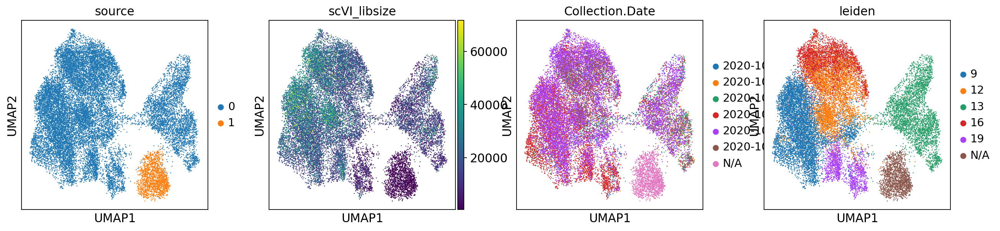

In [8]:
sc.pl.umap(eb_hesc_adata, color=["source", 'scVI_libsize', 'Collection.Date', "leiden"])

#### Characterizing differences among the iPSCs

In [10]:
ipsc_de = vae.differential_expression(eb_hesc_adata, groupby='leiden', group1=['9', '12', '16', '19'])

DE...: 100%|██████████| 4/4 [02:01<00:00, 30.49s/it]


In [25]:
markers = {}
cats = ['9', '12', '16', '19']
for i, c in enumerate(cats):
    cid = "{} vs Rest".format(c)
    cell_type_df = ipsc_de.loc[ipsc_de.comparison == cid]

    cell_type_df = cell_type_df[cell_type_df.lfc_mean > 0]

    cell_type_df = cell_type_df[cell_type_df["bayes_factor"] > 3]
    cell_type_df = cell_type_df[cell_type_df["non_zeros_proportion1"] > 0.1]

    markers[c] = cell_type_df.index.tolist()[:5]

In [26]:
markers

{'9': ['IDO1', 'AIF1', 'DPPA5', 'PRKCB', 'VAV1'],
 '12': ['FBN2', 'FOXD1', 'MECOM', 'DOK6', 'OLIG3'],
 '16': ['ACTA1', 'ABHD12B', 'NLRP7', 'DMD', 'GAD2'],
 '19': ['GABRP', 'MAGEA4', 'PPBP', 'ISM1', 'PPFIBP2']}

In [27]:
is_ipsc = [c in ['9', '12', '16', '19'] for c in eb_hesc_adata.obs['leiden']]
eb_ipsc = eb_hesc_adata[is_ipsc]

In [29]:
eb_ipsc

AnnData object with n_obs × n_vars = 16844 × 14223
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'DROPLET.TYPE', 'SNG.POSTERIOR', 'NUM.SNPS', 'individual', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'seurat_clusters', 'FREE.TYPE', 'FREE.SNG.POSTERIOR', 'FREE.NUM.SNPS', 'free.individual', 'ALL.TYPE', 'ALL.SNG.POSTERIOR', 'ALL.NUM.SNPS', 'all.individual', 'c.date', 'Feeder.passage', 'Feeder.Free.passage', 'sex', 'Replicate', 'formation.date', 'visual.confluence', 'total.cells.per.lane..correct.', 'X..Viable..based.on.average.of.two.counts.', 'days.maintained.in.LD.prior.to.formation', 'who.dissociated.the.lines.for.formation', 'cell.counter.correction', 'comments', 'collection.date', 'EB.appearance.notes', 'dissociated.by.', 'approx..time.in.accumax..in.minutes.', 'Collection.Date', 'Lane', 'Sample.ID', 'cDNA.amp.cycles', 'cDNA.total.yield', 'library.prep.batch', 'Sequencing.batch', 'col.group', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',

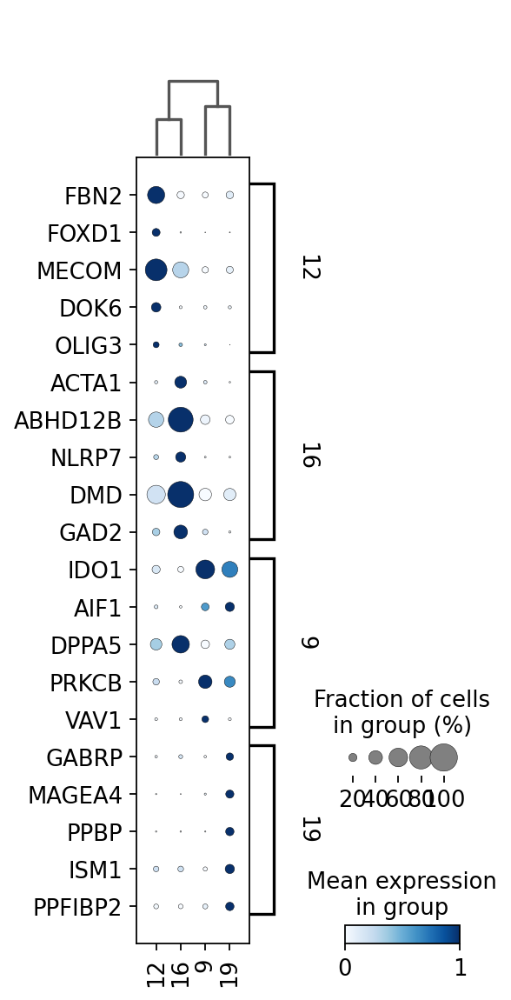

In [31]:
sc.tl.dendrogram(eb_ipsc, groupby="leiden", use_rep="X_scVI")
eb_ipsc.X = eb_ipsc.layers['counts']
sc.pl.dotplot(
    eb_ipsc,
    markers,
    groupby='leiden',
    dendrogram=True,
    color_map="Blues",
    swap_axes=True,
    use_raw=False,
    standard_scale="var",
)

Nothing is really standing out here. Moving on to comparing the iPSCs (more generally) to the human embryonic stem cells

In [35]:
celltypes = eb_hesc_adata.obs['leiden'].astype('string')
celltypes[celltypes=="N/A"] = "hESC"
celltypes[celltypes=="13"] = "endo"
celltypes[(celltypes != 'hESC') & (celltypes != 'endo')] = "iPSC"
eb_hesc_adata.obs['celltype'] = pd.Categorical(celltypes)

In [38]:
celltype_de = vae.differential_expression(eb_hesc_adata, groupby='celltype')

DE...: 100%|██████████| 3/3 [01:29<00:00, 29.68s/it]


In [41]:
ct_markers = {}
cats = ['iPSC', 'hESC', 'endo']
for i, c in enumerate(cats):
    cid = "{} vs Rest".format(c)
    cell_type_df = celltype_de.loc[celltype_de.comparison == cid]

    cell_type_df = cell_type_df[cell_type_df.lfc_mean > 0]

    cell_type_df = cell_type_df[cell_type_df["bayes_factor"] > 3]
    cell_type_df = cell_type_df[cell_type_df["non_zeros_proportion1"] > 0.1]

    ct_markers[c] = cell_type_df.index.tolist()[:5]

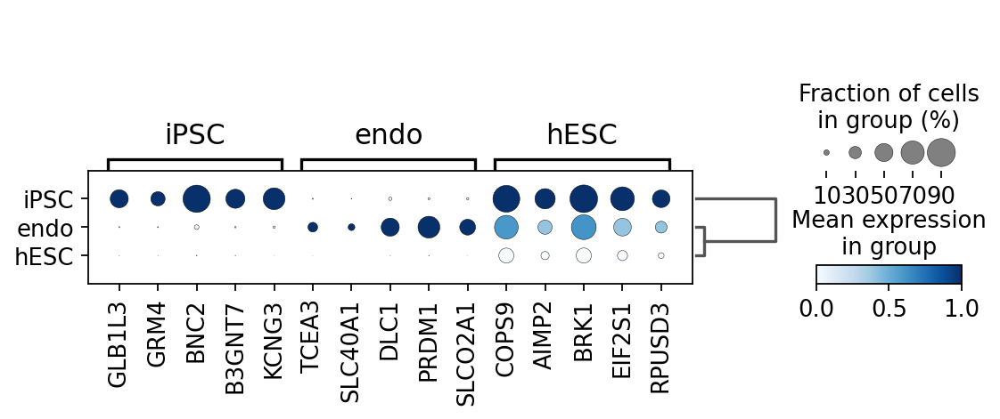

In [46]:
sc.tl.dendrogram(eb_hesc_adata, groupby="celltype", use_rep="X_scVI")
eb_hesc_adata.X = eb_hesc_adata.layers['counts']
sc.pl.dotplot(
    eb_hesc_adata,
    ct_markers,
    groupby='celltype',
    dendrogram=True,
    color_map="Blues",
    #swap_axes=True,
    use_raw=False,
    standard_scale="var",
)

It might be better to directly compare hESCs to iPSCs

In [47]:
esc_de = vae.differential_expression(eb_hesc_adata, groupby='celltype', group1=['iPSC', 'hESC'])

DE...: 100%|██████████| 2/2 [00:59<00:00, 29.65s/it]


In [48]:
esc_markers = {}
cats = ['iPSC', 'hESC']
for i, c in enumerate(cats):
    cid = "{} vs Rest".format(c)
    cell_type_df = esc_de.loc[esc_de.comparison == cid]

    cell_type_df = cell_type_df[cell_type_df.lfc_mean > 0]

    cell_type_df = cell_type_df[cell_type_df["bayes_factor"] > 3]
    cell_type_df = cell_type_df[cell_type_df["non_zeros_proportion1"] > 0.1]

    esc_markers[c] = cell_type_df.index.tolist()[:10]

In [ ]:
sc.tl.dendrogram(eb_hesc_adata, groupby="celltype", use_rep="X_scVI")
eb_hesc_adata.X = eb_hesc_adata.layers['counts']
sc.pl.dotplot(
    eb_hesc_adata,
    esc_markers,
    groupby='celltype',
    dendrogram=True,
    color_map="Blues",
    #swap_axes=True,
    use_raw=False,
    standard_scale="var",
)

Alternatively, what if we just normalized very primitively

In [62]:
sc.pp.normalize_total(eb_hesc_adata, key_added="scanpy_lib_factor")
sc.pp.log1p(eb_hesc_adata)
eb_hesc_adata.layers["lognorm"] = eb_hesc_adata.X
sc.pp.scale(eb_hesc_adata)
eb_hesc_adata.layers["scaled"] = eb_hesc_adata.X

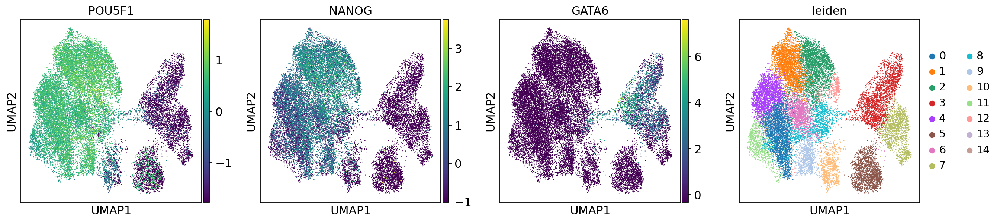

In [121]:
sc.pl.umap(eb_hesc_adata, color=["POU5F1", "NANOG", "GATA6", "leiden"], use_raw=False)

In [ ]:
What are the

Try subsetting some of the EB iPSC's

In [110]:
eb_endoderm = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.endoderm.processed.h5ad")

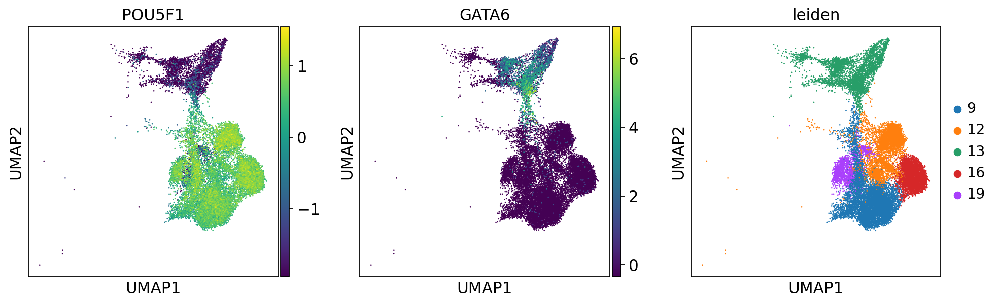

In [112]:
sc.pl.umap(eb_endoderm, color=["POU5F1", "GATA6", "leiden"])

In [113]:
eb_ipsc = eb_endoderm[eb_endoderm.obs['leiden']!="13"]
eb_ipsc_sample = eb_ipsc[random.sample(range(eb_ipsc.shape[0]), 1660)]

Try just combining the two samples with even numbers

In [114]:
eb_ipsc_sample.obs['source'] = 'EB'

Trying to set attribute `.obs` of view, copying.


In [115]:
eb_ipsc

View of AnnData object with n_obs × n_vars = 16844 × 5000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'DROPLET.TYPE', 'SNG.POSTERIOR', 'NUM.SNPS', 'individual', 'percent.mt', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.8', 'seurat_clusters', 'FREE.TYPE', 'FREE.SNG.POSTERIOR', 'FREE.NUM.SNPS', 'free.individual', 'ALL.TYPE', 'ALL.SNG.POSTERIOR', 'ALL.NUM.SNPS', 'all.individual', 'c.date', 'Feeder.passage', 'Feeder.Free.passage', 'sex', 'Replicate', 'formation.date', 'visual.confluence', 'total.cells.per.lane..correct.', 'X..Viable..based.on.average.of.two.counts.', 'days.maintained.in.LD.prior.to.formation', 'who.dissociated.the.lines.for.formation', 'cell.counter.correction', 'comments', 'collection.date', 'EB.appearance.notes', 'dissociated.by.', 'approx..time.in.accumax..in.minutes.', 'Collection.Date', 'Lane', 'Sample.ID', 'cDNA.amp.cycles', 'cDNA.total.yield', 'library.prep.batch', 'Sequencing.batch', 'col.group', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_coun

In [116]:
ipsc_hesc_adata = eb_ipsc_sample.concatenate(hesc_adata, join = 'inner', batch_key= 'source')

/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/anndata/_core/merge.py:895: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [117]:
ipsc_hesc_adata.obs['Collection.Date'] = pd.Categorical(ipsc_hesc_adata.obs['Collection.Date'])
ipsc_hesc_adata.obs['library.prep.batch'] = pd.Categorical(ipsc_hesc_adata.obs['library.prep.batch'])

In [118]:
scvi.data.setup_anndata(ipsc_hesc_adata, batch_key="source",
                        categorical_covariate_keys=['Collection.Date', 'library.prep.batch'])

INFO     Using batches from adata.obs["source"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 3320 cells, 2155 vars, 2 batches, 
         1 labels, and 0 proteins. Also registered 2 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/scvi/data/_utils.py:22: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  warnings.warn(


In [119]:
vae2 = scvi.model.SCVI(ipsc_hesc_adata, n_layers=2, n_latent=10,
                      dispersion='gene',
                      gene_likelihood='nb')

/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/scvi/model/base/_base_model.py:149: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [120]:
vae2.train()

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
Set SLURM handle signals.


Epoch 1/400:   0%|          | 0/400 [00:00<?, ?it/s]

ValueError: The parameter loc has invalid values

In [102]:
ipsc_hesc_adata.obsm["X_scVI"] = vae2.get_latent_representation()
sc.pp.neighbors(ipsc_hesc_adata, use_rep="X_scVI")
sc.tl.leiden(ipsc_hesc_adata)
sc.tl.umap(ipsc_hesc_adata)

... storing 'DROPLET.TYPE' as categorical
... storing 'individual' as categorical
... storing 'SCT_snn_res.0.8' as categorical
... storing 'seurat_clusters' as categorical
... storing 'FREE.TYPE' as categorical
... storing 'ALL.TYPE' as categorical
... storing 'all.individual' as categorical
... storing 'c.date' as categorical
... storing 'who.dissociated.the.lines.for.formation' as categorical
... storing 'comments' as categorical
... storing 'approx..time.in.accumax..in.minutes.' as categorical
... storing 'Sample.ID' as categorical
... storing 'col.group' as categorical
... storing 'celltype' as categorical


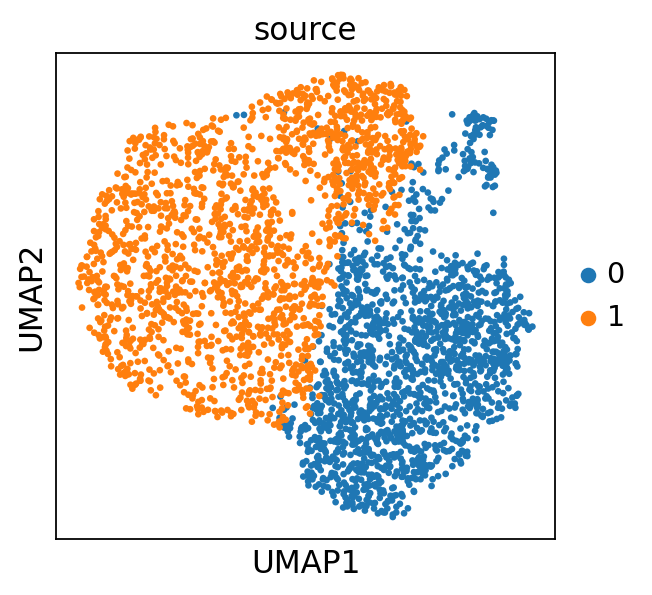

In [103]:
sc.pl.umap(ipsc_hesc_adata, color=["source"])

In [104]:
ipsc_hesc_adata.layers['counts'] = ipsc_hesc_adata.X
sc.pp.normalize_total(ipsc_hesc_adata, key_added="scanpy_lib_factor")
sc.pp.log1p(ipsc_hesc_adata)
sc.pp.scale(ipsc_hesc_adata)

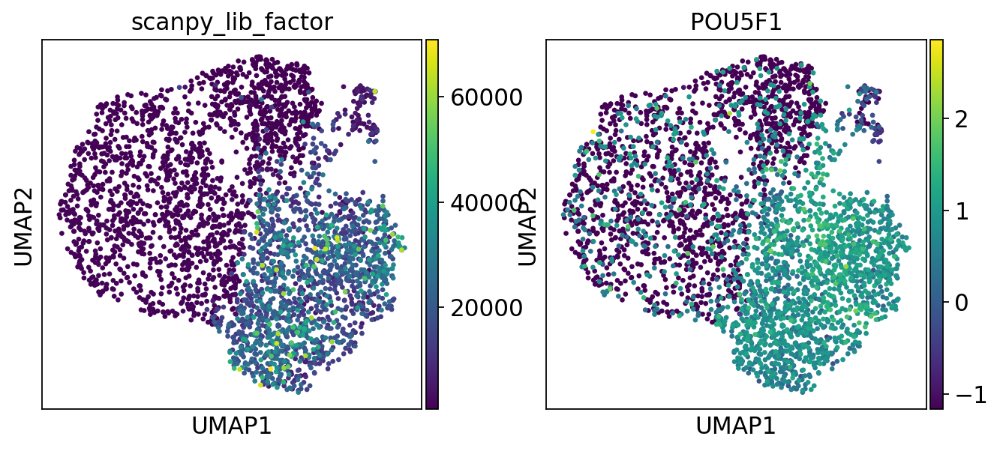

In [105]:
sc.pl.umap(ipsc_hesc_adata, color=["scanpy_lib_factor", "POU5F1"])

In [118]:
ipsc_hesc_adata.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.hesc.ipsc.h5ad")
vae2.save("/project2/gilad/jpopp/ebQTL/data/scvi_models/scvi_nb_20211031_cellsubsampling", save_anndata=True)

In [2]:
ipsc_hesc_adata = sc.read_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.hesc.ipsc.h5ad")

In [4]:
vae2 = scvi.model.SCVI.load("/project2/gilad/jpopp/ebQTL/data/scvi_models/scvi_nb_20211031_cellsubsampling")

INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Registered keys:['X', 'batch_indices', 'local_l_mean', 'local_l_var', 'labels',     
         'cat_covs']                                                                         
INFO     Successfully registered anndata object containing 3320 cells, 14223 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 2 extra categorical covariates and 0 extra
         continuous covariates.                                                              


/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/scvi/data/_utils.py:22: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  warnings.warn(
/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/scvi/data/_utils.py:22: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  warnings.warn(
/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/scvi/model/base/_base_model.py:149: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


In [8]:
ipsc_hesc_adata.obs['scVI_libsize'] = vae2.get_latent_library_size()

/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/scvi/model/base/_base_model.py:149: UserWarning: Make sure the registered X field in anndata contains unnormalized count data.
  warnings.warn(


ValueError: The parameter loc has invalid values

/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/jpopp/.conda/envs/singlecell/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


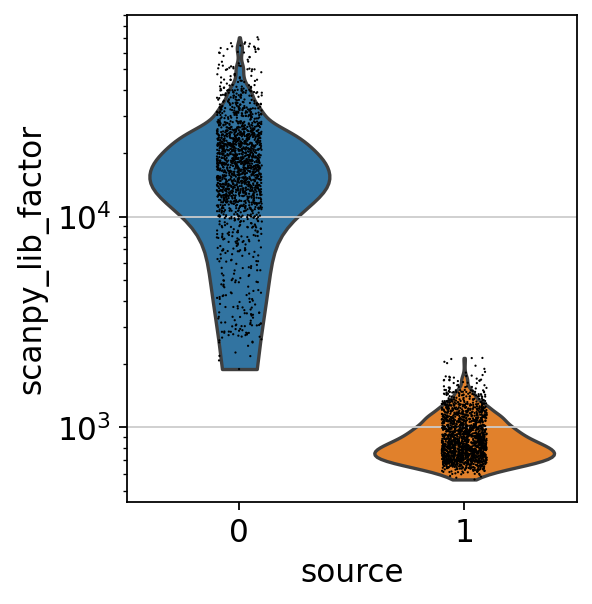

In [7]:
sc.pl.violin(ipsc_hesc_adata, keys=["scanpy_lib_factor"], groupby="source", log=True)

Now try subsampling the counts from the EB data

In [62]:
eb_ipsc_subsample = eb_ipsc_sample.copy()

In [70]:
lib_factors = ipsc_hesc_adata[ipsc_hesc_adata.obs['source']=='1'].obs['scanpy_lib_factor']

In [72]:
sc.pp.downsample_counts(eb_ipsc_subsample, counts_per_cell=lib_factors)

In [111]:
ipscsub_hesc_adata = eb_ipsc_subsample.concatenate(hesc_adata, join = 'inner', batch_key= 'source')
ipscsub_hesc_adata.obs['Collection.Date'] = pd.Categorical(ipscsub_hesc_adata.obs['Collection.Date'])
ipscsub_hesc_adata.obs['library.prep.batch'] = pd.Categorical(ipscsub_hesc_adata.obs['library.prep.batch'])

In [112]:
scvi.data.setup_anndata(ipscsub_hesc_adata, batch_key="source",
                        categorical_covariate_keys=['Collection.Date', 'library.prep.batch'])

INFO     Using batches from adata.obs["source"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 3320 cells, 14223 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 2 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


In [113]:
vae3 = scvi.model.SCVI(ipscsub_hesc_adata, n_layers=2, n_latent=10,
                      dispersion='gene',
                      gene_likelihood='nb')

In [114]:
vae3.train(early_stopping=True)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
Set SLURM handle signals.


Epoch 114/400:  28%|██▊       | 114/400 [01:10<02:57,  1.62it/s, loss=1.9e+03, v_num=1] 


In [115]:
ipscsub_hesc_adata.obsm["X_scVI"] = vae3.get_latent_representation()
sc.pp.neighbors(ipscsub_hesc_adata, use_rep="X_scVI")
sc.tl.leiden(ipscsub_hesc_adata)
sc.tl.umap(ipscsub_hesc_adata)

... storing 'DROPLET.TYPE' as categorical
... storing 'individual' as categorical
... storing 'SCT_snn_res.0.8' as categorical
... storing 'seurat_clusters' as categorical
... storing 'FREE.TYPE' as categorical
... storing 'ALL.TYPE' as categorical
... storing 'all.individual' as categorical
... storing 'c.date' as categorical
... storing 'who.dissociated.the.lines.for.formation' as categorical
... storing 'comments' as categorical
... storing 'approx..time.in.accumax..in.minutes.' as categorical
... storing 'Sample.ID' as categorical
... storing 'col.group' as categorical
... storing 'celltype' as categorical


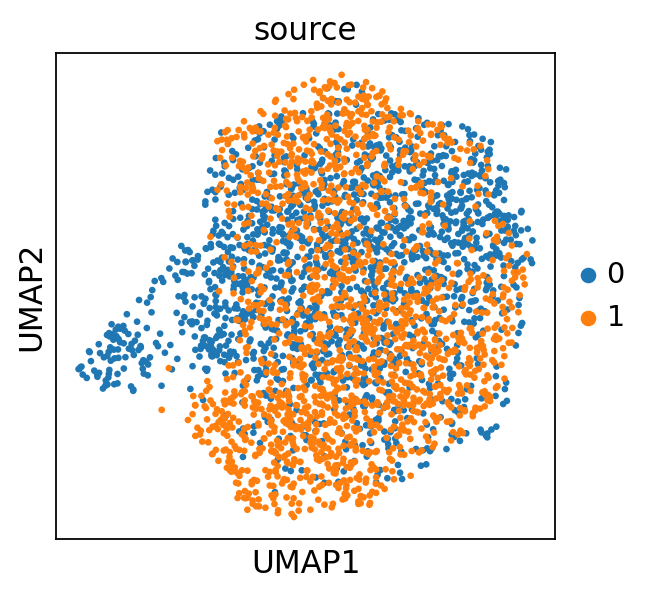

In [116]:
sc.pl.umap(ipscsub_hesc_adata, color=["source"])

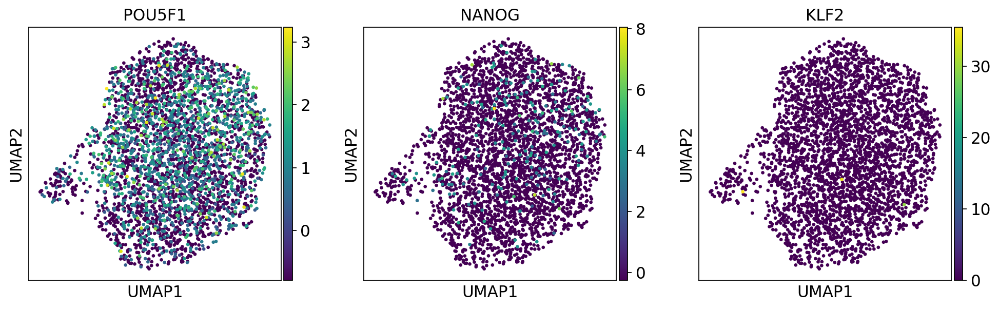

In [117]:
ipscsub_hesc_adata.layers['counts'] = ipscsub_hesc_adata.X
sc.pp.normalize_total(ipscsub_hesc_adata, key_added="scanpy_lib_factor")
sc.pp.log1p(ipscsub_hesc_adata)
sc.pp.scale(ipscsub_hesc_adata)
sc.pl.umap(ipscsub_hesc_adata, color=["POU5F1", "NANOG", "KLF2"])

In [119]:
ipscsub_hesc_adata.write_h5ad("/project2/gilad/jpopp/ebQTL/data/single_cell_objects/Lowpass.3seqbatches.merged.hesc.ipscsub.h5ad")
vae3.save("/project2/gilad/jpopp/ebQTL/data/scvi_models/scvi_nb_20211031_cellandreadsubsampling", save_anndata=True)

### Ectoderm lineage

TPBG is a marker of trophoblast cells, which are the external cells of an early embryo. NEUROD1 is important in neural development (expressed in cerebellum in FCA), and SOX10 is important in neural crest and peripheral nervous system development (expressed in cerebrum in FCA). 

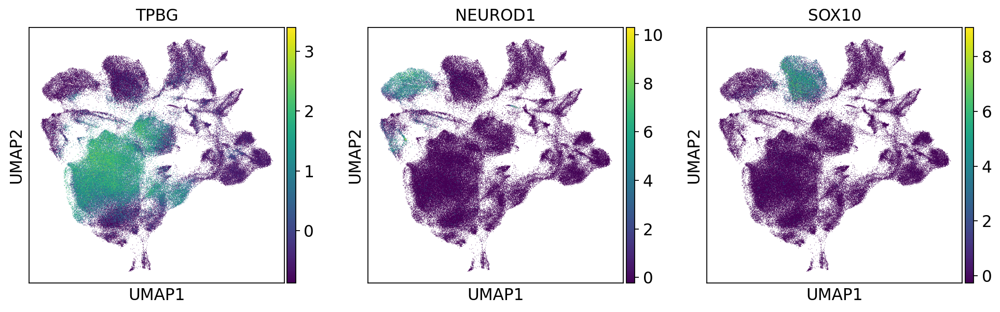

In [9]:
sc.pl.umap(eb_adata, color=['TPBG', 'NEUROD1', 'SOX10'], use_raw=False)

KeyError: 'Could not find key CD83 in .var_names or .obs.columns.'

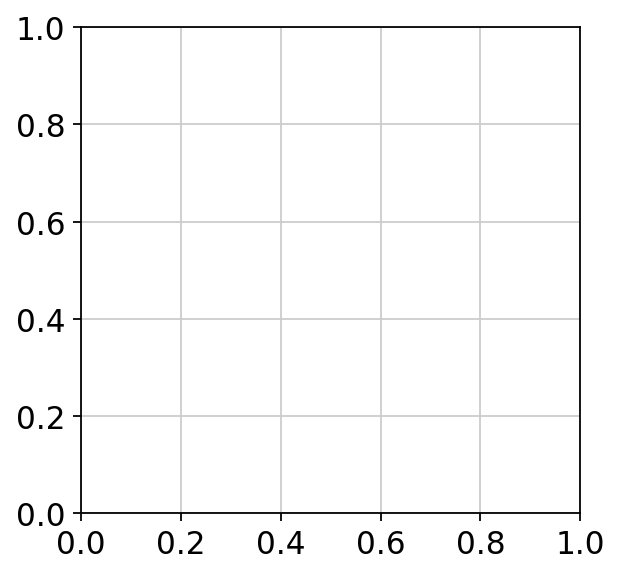

In [15]:
sc.pl.umap(eb_adata, color=[''], use_raw=False)

## Cluster Analysis

Look at whether scVI factors are picking up on clear lineages

In [ ]:
for i in range(eb_adata.obsm['X_scVI'].shape[1]):
    eb_adata.obs['scVI_' + str(i+1)] = eb_adata.obsm['X_scVI'][:, i]

In [ ]:
sc.pl.umap(eb_adata, color=['scVI_1', 'scVI_2', 'scVI_3', 'scVI_4', 'scVI_5',
                           'scVI_6', 'scVI_7', 'scVI_8', 'scVI_9', 'scVI_10'])

Now look at the leiden clusters

In [ ]:
sc.pl.umap(eb_adata, color='leiden')

We can go for a slightly lower resolution to start off

In [ ]:
#eb_adata.obs['leiden_1.0'] = eb_adata.obs['leiden']
sc.tl.leiden(eb_adata, resolution=0.5, key_added='leiden_0.5')
sc.pl.umap(eb_adata, color='leiden_0.5')

In [ ]:
eb_adata.X = eb_adata.layers['lognorm']

In [ ]:
sc.tl.rank_genes_groups(eb_adata, groupby='leiden_0.5', groups=['0', '1', '4', '12', '15'])

In [ ]:
sc.pl.rank_genes_groups(eb_adata)

In [ ]:
eb_adata.obs['leiden_0.5'].value_counts()

### Reclustering with sampling

In [ ]:
cluster_assignments = pd.DataFrame(eb_adata.obs['leiden_0.5'])
cluster_assignments

In [ ]:
cluster_assignments.groupby('leiden_0.5').sample(500)

## 